In [1]:
#Deep Q Network for ENO with reward propagation
#No. of Actions = 10
#Henergy limited to HMAX = 1000
#Battery Capacity = 20000
#Hidden layers => 1 x 20
#BOPT = 0.6*BMAX
#Only one hidden layer


In [2]:
%matplotlib inline

In [3]:
import pulp
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

import random
import string

import pandas as pd
import numpy as np
from random import shuffle
from mpl_toolkits.mplot3d import Axes3D

import torch
import torch.nn as nn
import torch.nn.functional as F

In [4]:
np.random.seed(230228)

In [5]:
# Hyper Parameters
BATCH_SIZE = 24
LR = 0.02                   # learning rate
EPSILON = 0.7               # greedy policy
GAMMA = 0.9                 # reward discount
LAMBDA = 0.9                # parameter decay
TARGET_REPLACE_ITER = 24*7*4*2    # target update frequency (every two months)
MEMORY_CAPACITY = 24*7*4*6      # store upto six month worth of memory   

N_ACTIONS = 10 #no. of duty cycles (0,1,2,3,4)
N_STATES = 4 #number of state space parameter [batt, enp, henergy, fcast]
HIDDEN_LAYER = 20

In [6]:
class ENO(object):
    def __init__(self, year=2010):
        self.year = year
        self.day = None
        self.hr = None
        
        self.TIME_STEPS = None
        self.NO_OF_DAYS = None
        
        self.BMIN = 0.0
        self.BMAX = 20000.0 #Battery capacity
        self.BOPT = 0.6 * self.BMAX #Assuming 60% of battery is the optimal level
        self.HMAX = 1000
        
        self.senergy = None #matrix with harvested energy data for the entire year
        self.fforecast = None #matrix with forecast values for each day
        
        self.batt = None #battery variable
        self.enp = None #enp at end of hr
        self.henergy = None #harvested energy variable
        self.fcast = None #forecast variable
    
    #function to map total day energy into day_state
    def get_day_state(self,tot_day_energy):
        if (tot_day_energy < 2500):
            day_state = 0
        elif (2500 <= tot_day_energy < 5000):
            day_state = 1
        elif (5000 <= tot_day_energy < 8000):
            day_state = 2
        elif (8000 <= tot_day_energy < 10000):
            day_state = 3
        elif (10000 <= tot_day_energy < 12000):
            day_state = 4
        else:
            day_state = 5
        return int(day_state)

    #function to get the solar data for the given year and prep it
    def get_data(self):
        filename = str(self.year)+'.csv'
        #skiprows=4 to remove unnecessary title texts
        #usecols=4 to read only the Global Solar Radiation (GSR) values
        solar_radiation = pd.read_csv(filename, skiprows=4, encoding='shift_jisx0213', usecols=[4])
        
        #convert dataframe to numpy array
        solar_radiation = solar_radiation.values
        solar_energy = np.array([i *0.0165*1000000*0.15*1000/(60*60) for i in solar_radiation])
        
        #reshape solar_energy into no_of_daysx24 array
        _senergy = solar_energy.reshape(-1,24)
        _senergy[np.isnan(_senergy)] = 0 #convert missing data in CSV files to zero
        self.senergy = np.clip(_senergy,0,self.HMAX) #limit the amount of harvested energy to HMAX        
        
        #create a perfect forecaster
        tot_day_energy = np.sum(_senergy, axis=1) #contains total energy harvested on each day
        get_day_state = np.vectorize(self.get_day_state)
        self.fforecast = get_day_state(tot_day_energy)
        
        return 0
    
    def reset(self):
        
        self.get_data() #first get data for the given year
        
        self.TIME_STEPS = self.senergy.shape[1]
        self.NO_OF_DAYS = self.senergy.shape[0]
        
        print("Environment is RESET")
        
        self.day = 0
        self.hr = 0
        
        self.batt = self.BOPT #battery returns to optimal level
        self.enp = self.BOPT - self.batt #enp is reset to zero
        self.henergy = self.senergy[self.day][self.hr] 
        self.fcast = self.fforecast[self.day]
        
        state = [self.batt/self.BMAX, self.enp/(self.BMAX/2), self.henergy/self.HMAX, self.fcast/5] #normalizing all state values within [0,1] interval
        reward = 0
        done = False
        info = "RESET"
        return [state, reward, done, info]
    
    
    #reward function
    def rewardfn(self):
        mu = 0
        sig = 1000
        if(np.abs(self.enp) <= 2400): #24hr * 100mW/hr
            return ((1./(np.sqrt(2.*np.pi)*sig)*np.exp(-np.power((self.enp - mu)/sig, 2.)/2)) * 1000000)
        else:
            return -100 - 0.05*np.abs(self.enp)
    
    def step(self, action):
        done = False
        info = "OK"
#         print("Next STEP")
        
        reward = 0
        e_consumed = (action+1)*500/N_ACTIONS
        
        self.batt += (self.henergy - e_consumed)
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX)
        self.enp = self.BOPT - self.batt
        
        if(self.hr < self.TIME_STEPS - 1):
            self.hr += 1
            self.henergy = self.senergy[self.day][self.hr] 
        else:
            if(self.day < self.NO_OF_DAYS -1):
                reward = self.rewardfn() #give reward only at the end of the day
                self.hr = 0
                self.day += 1
                self.henergy = self.senergy[self.day][self.hr] 
                self.fcast = self.fforecast[self.day]
            else:
                reward = self.rewardfn()
                done = True
                info = "End of the year"
                
        _state = [self.batt/self.BMAX, self.enp/(self.BMAX/2), self.henergy/self.HMAX, self.fcast/5]
        return [_state, reward, done, info]

In [7]:
class Net(nn.Module):
    def __init__(self, ):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(N_STATES, HIDDEN_LAYER)
        self.fc1.weight.data.normal_(0, 0.1)   # initialization
        
#         self.fc2 = nn.Linear(HIDDEN_LAYER, HIDDEN_LAYER)
#         self.fc2.weight.data.normal_(0, 0.1)   # initialization
        
#         self.fc3 = nn.Linear(HIDDEN_LAYER, HIDDEN_LAYER)
#         self.fc3.weight.data.normal_(0, 0.1)   # initialization
        
#         self.fc4 = nn.Linear(HIDDEN_LAYER, HIDDEN_LAYER)
#         self.fc4.weight.data.normal_(0, 0.1)   # initialization
        
        self.out = nn.Linear(HIDDEN_LAYER, N_ACTIONS)
        self.out.weight.data.normal_(0, 0.1)   # initialization

    def forward(self, x):
        x = self.fc1(x)
        x = F.relu(x)
        actions_value = self.out(x)
        return actions_value

In [8]:
class DQN(object):
    def __init__(self):
        self.eval_net, self.target_net = Net(), Net()
        print("Neural net")
        print(self.eval_net)

        self.learn_step_counter = 0                                     # for target updating
        self.memory_counter = 0                                         # for storing memory
        self.memory = np.zeros((MEMORY_CAPACITY, N_STATES * 2 + 2))     # initialize memory [mem: ([s], a, r, [s_]) ]
        self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR)
        self.loss_func = nn.MSELoss()

    def choose_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        # input only one sample
        if np.random.uniform() < EPSILON:   # greedy
            actions_value = self.eval_net.forward(x)
            action = torch.max(actions_value, 1)[1].data.numpy()
            action = action[0] # return the argmax index
        else:   # random
            action = np.random.randint(0, N_ACTIONS)
            action = action
        return action
    
    def choose_greedy_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        # input only one sample
    
        actions_value = self.eval_net.forward(x)
        action = torch.max(actions_value, 1)[1].data.numpy()
        action = action[0] # return the argmax index

        return action

    def store_transition(self, s, a, r, s_):
        transition = np.hstack((s, [a, r], s_))
        # replace the old memory with new memory
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory[index, :] = transition
        self.memory_counter += 1
    
    def store_day_transition(self, transition_rec):
        data = transition_rec
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory= np.insert(self.memory, index, data,0)
        self.memory_counter += transition_rec.shape[0]

    def learn(self):
        # target parameter update
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            self.target_net.load_state_dict(self.eval_net.state_dict())
        self.learn_step_counter += 1

        # sample batch transitions
        sample_index = np.random.choice(MEMORY_CAPACITY, BATCH_SIZE)
        b_memory = self.memory[sample_index, :]
        b_s = torch.FloatTensor(b_memory[:, :N_STATES])
        b_a = torch.LongTensor(b_memory[:, N_STATES:N_STATES+1].astype(int))
        b_r = torch.FloatTensor(b_memory[:, N_STATES+1:N_STATES+2])
        b_s_ = torch.FloatTensor(b_memory[:, -N_STATES:])

        # q_eval w.r.t the action in experience
        q_eval = self.eval_net(b_s).gather(1, b_a)  # shape (batch, 1)
        q_next = self.target_net(b_s_).detach()     # detach from graph, don't backpropagate
        q_target = b_r + GAMMA * q_next.max(1)[0].view(BATCH_SIZE, 1)   # shape (batch, 1)
        loss = self.loss_func(q_eval, q_target)

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

Neural net
Net(
  (fc1): Linear(in_features=4, out_features=20, bias=True)
  (out): Linear(in_features=20, out_features=10, bias=True)
)

EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = -295.10679187229454
Better reward ->  -295.10679187229454
Saving model


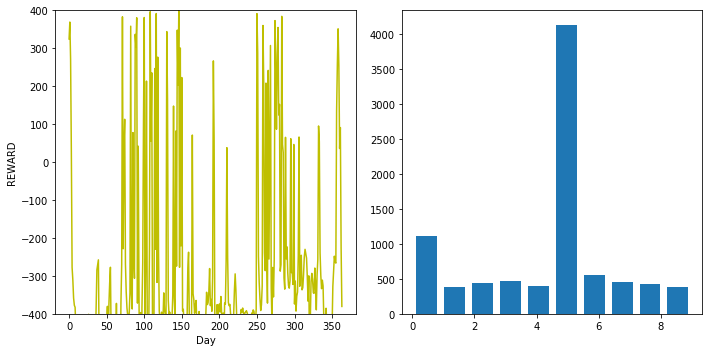


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = -171.35983453136004
Better reward ->  -171.35983453136004
Saving model


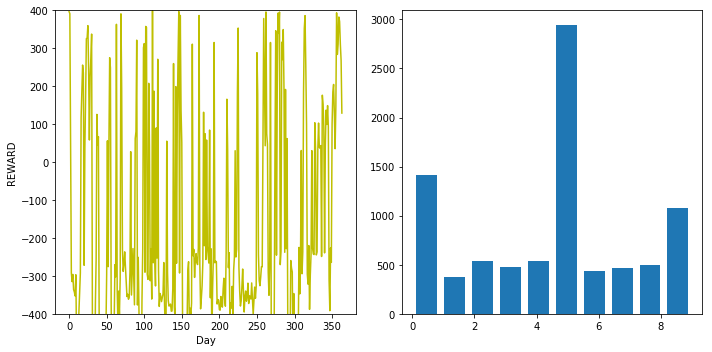


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = -133.52962150220915
Better reward ->  -133.52962150220915
Saving model


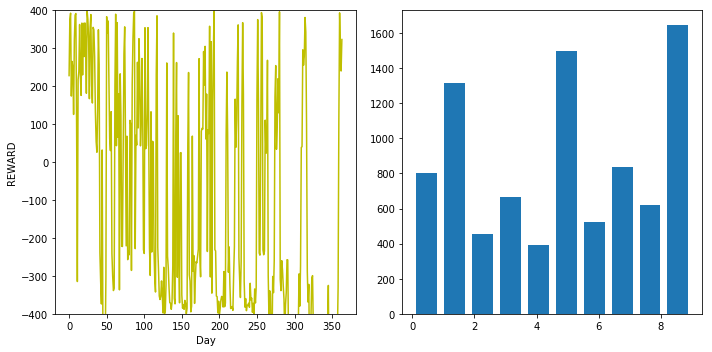


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = -24.725488266568487
Better reward ->  -24.725488266568487
Saving model


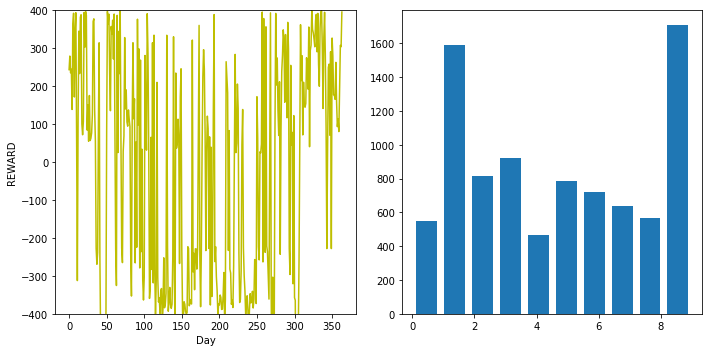


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 157.6187274108905
Better reward ->  157.6187274108905
Saving model


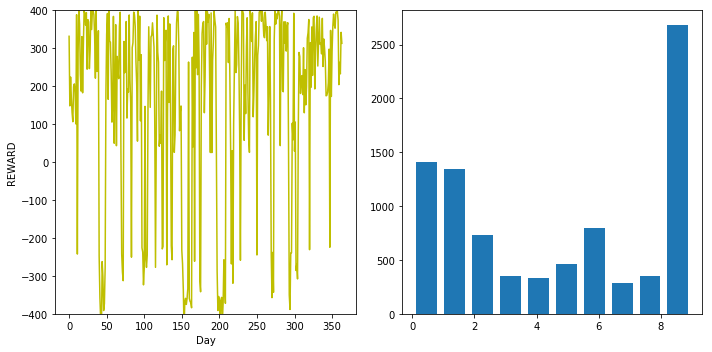


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 103.47753753849693


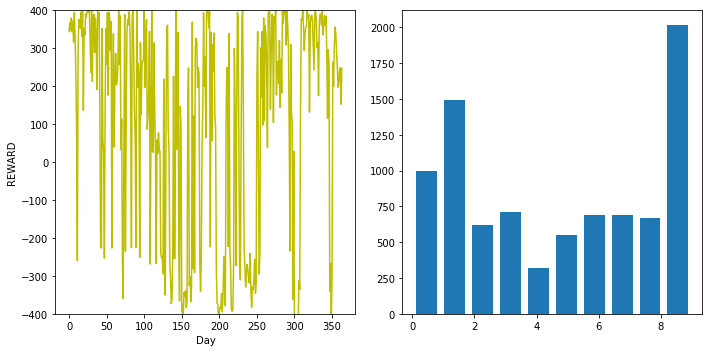


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 42.83333836061801


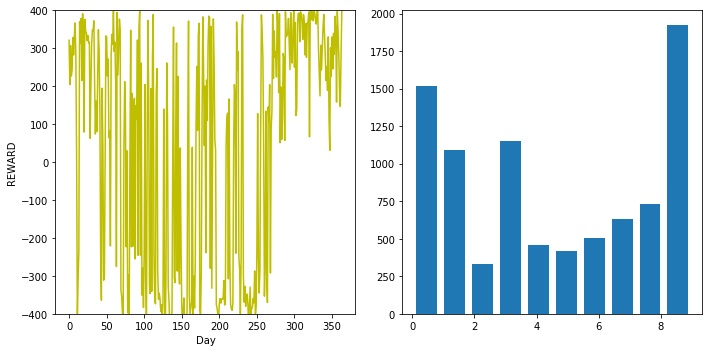


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 84.16008444202946


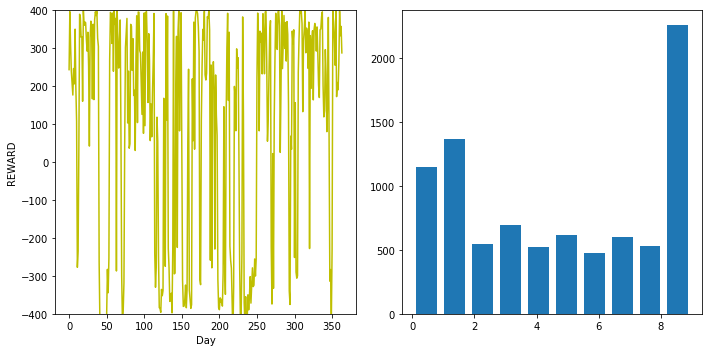


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 132.94573804241048


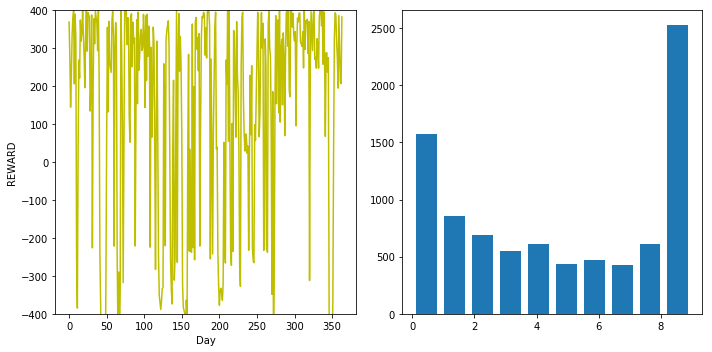


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 138.21064486571444


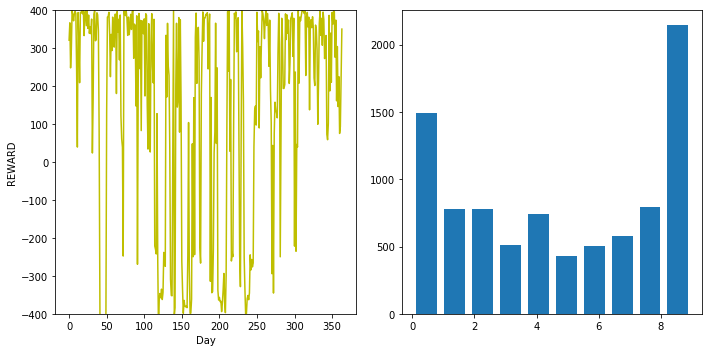


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 142.83711155821146


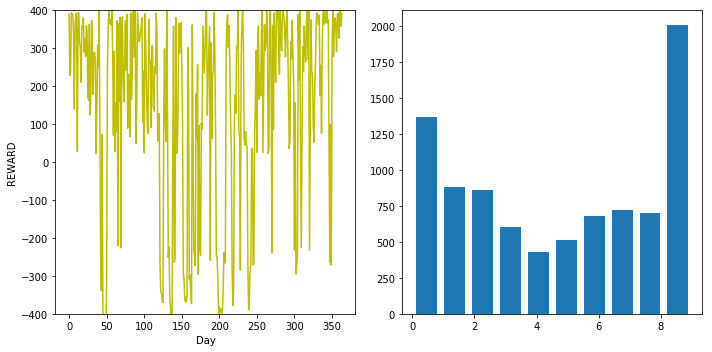


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 73.79794545226777


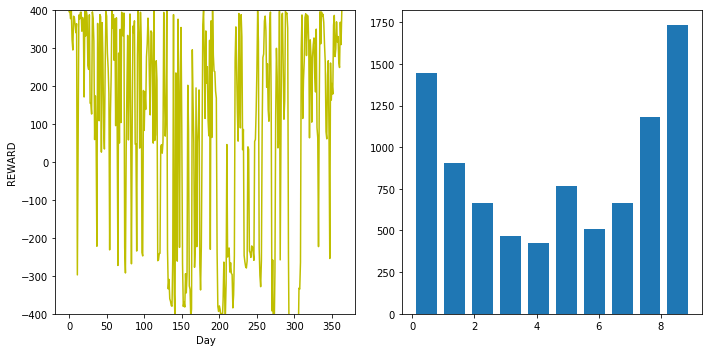


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 98.3402598696805


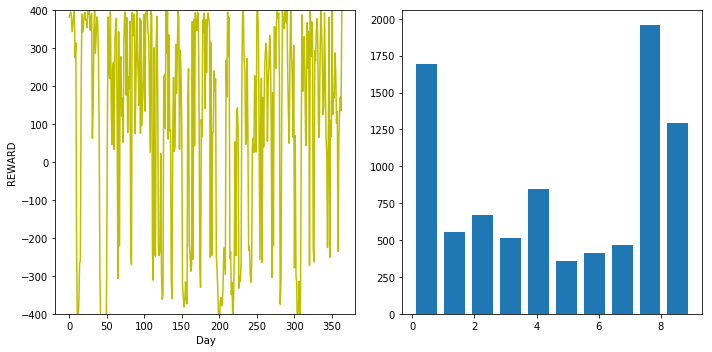


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 31.876599522069913


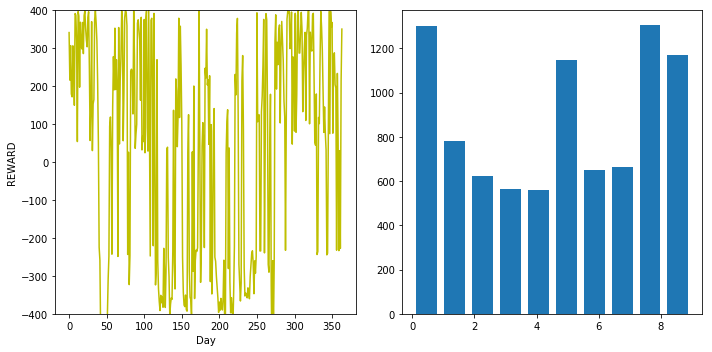


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 63.88347829282949


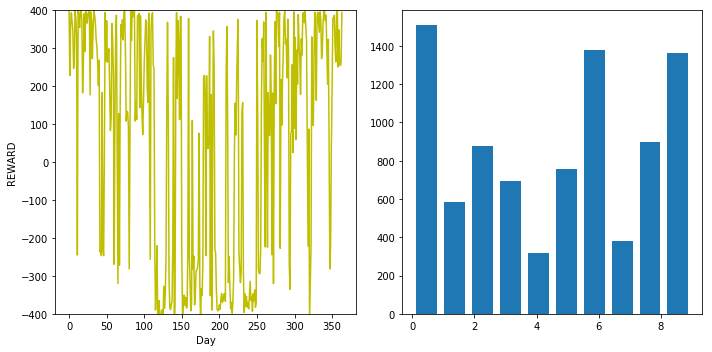


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = -57.15123063780787


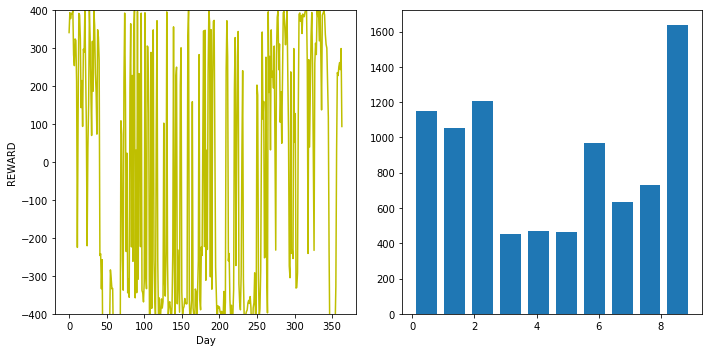


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = -33.393518176457036


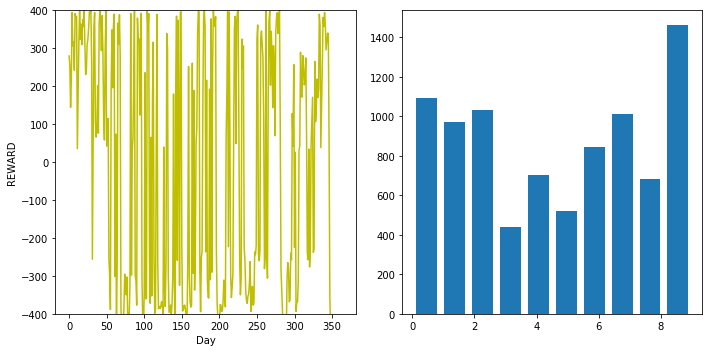


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 83.73410171028782


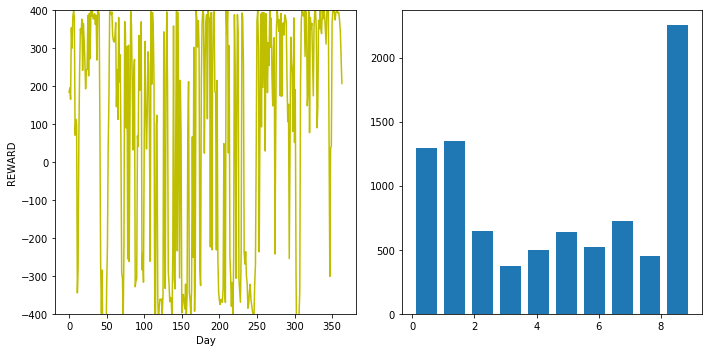


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 91.86857799791893


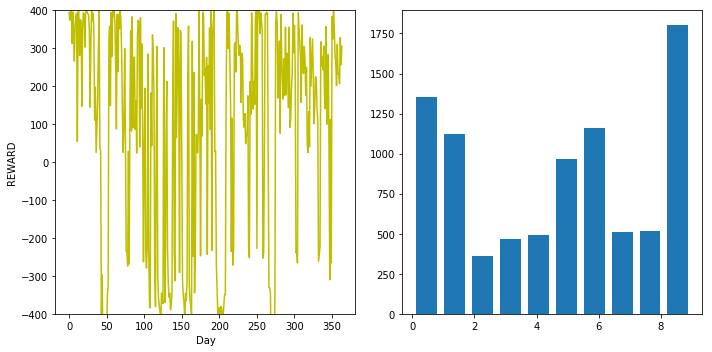


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 117.62921005400769


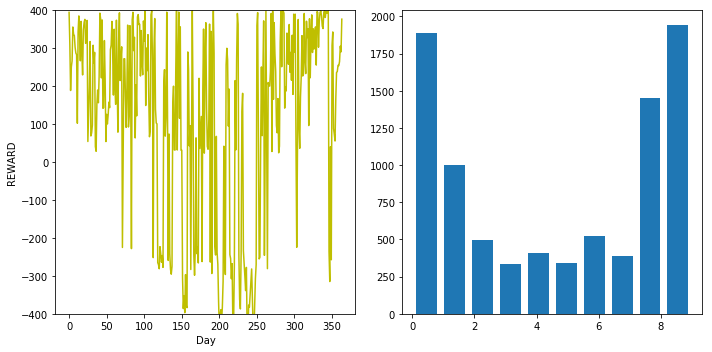


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 65.72641068978682


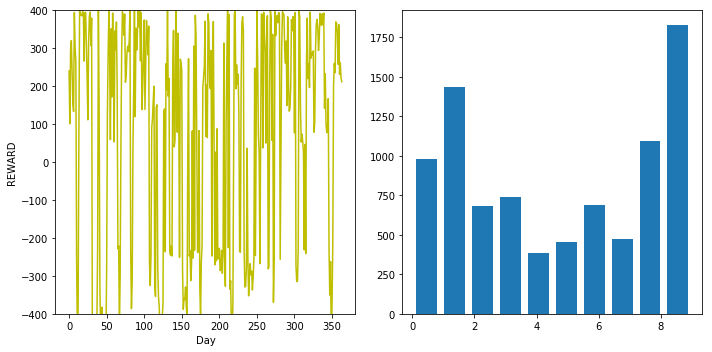


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 103.51158699091532


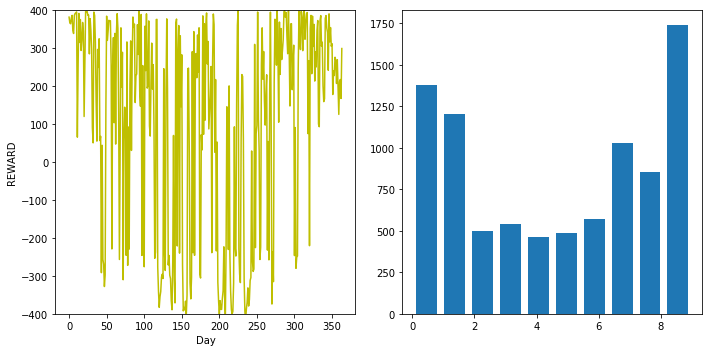


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 112.18705146752474


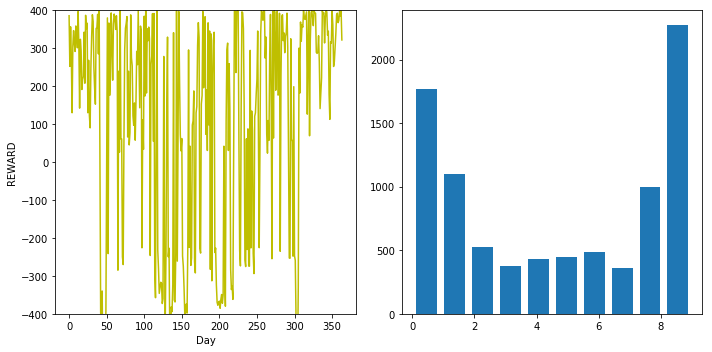


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 86.48968158231203


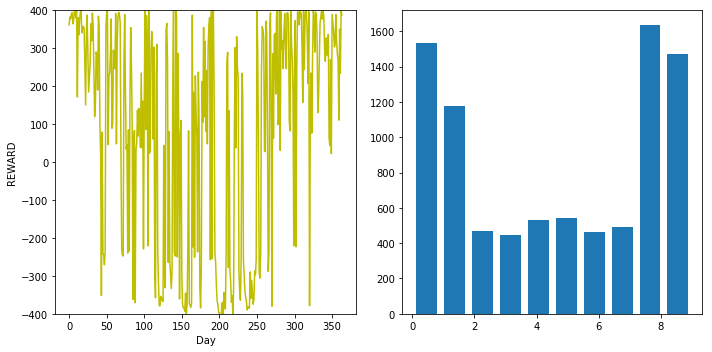


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 79.72263706278534


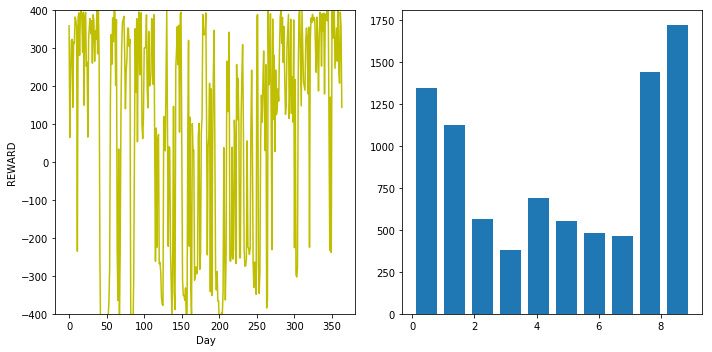


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 28.782263239617944


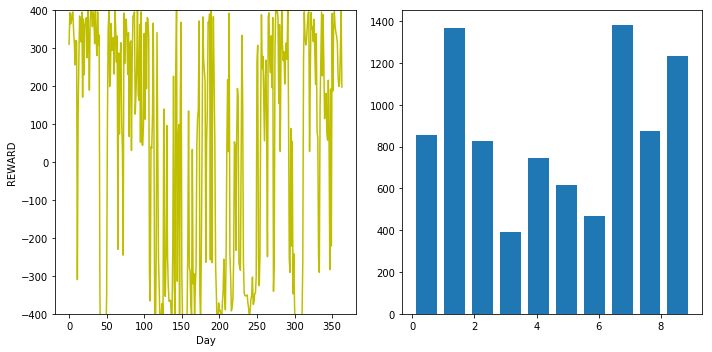


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 55.97903915701094


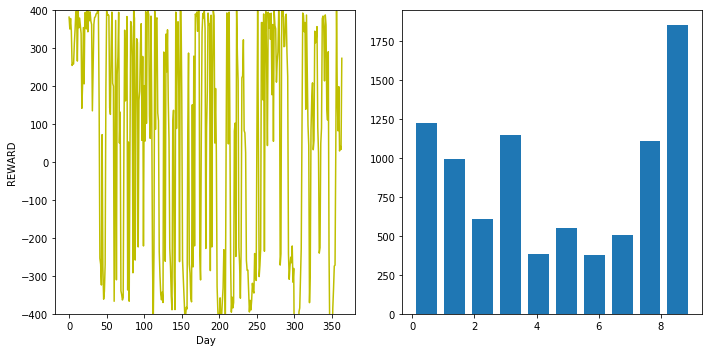


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 19.21586152281216


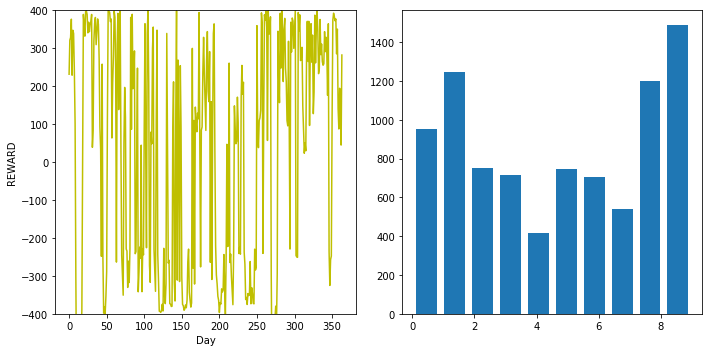


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = -25.896447724729203


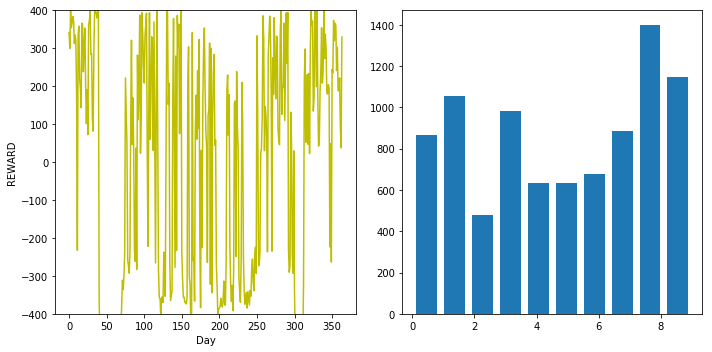


EPSILON =  0.7
LR =  0.02
LAMBDA =  0.9
Environment is RESET
End of Year
Average reward = 19.429258248580805


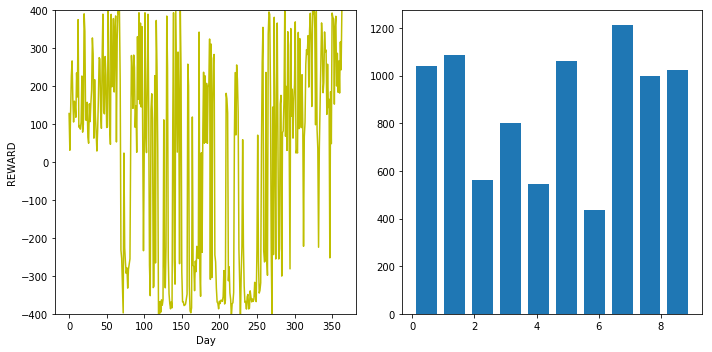

Net(
  (fc1): Linear(in_features=4, out_features=20, bias=True)
  (out): Linear(in_features=20, out_features=10, bias=True)
)

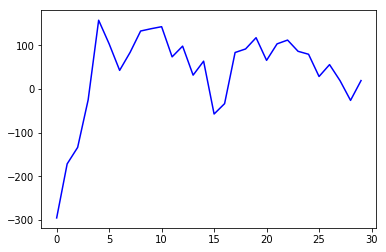

In [9]:
dqn = DQN()
eno = ENO(2010)
NO_OF_ITERATIONS = 30
best_avg_reward = -1000 #initialize best average reward to very low value

PFILENAME = ''.join(random.choice(string.ascii_uppercase + string.digits) for _ in range(8))
PFILENAME = PFILENAME + ".pt"
avg_reward_rec = np.empty(1)

for iteration in range(NO_OF_ITERATIONS):

    print('\nCollecting experience... Iteration:', iteration)
    print("EPSILON = ", EPSILON)
    print("LR = ", LR)
    print("LAMBDA = ", LAMBDA)

    s, r, done, info = eno.reset()
    record = np.empty(4)

    transition_rec = np.zeros((eno.TIME_STEPS, N_STATES * 2 + 2)) #record all the transition in one day

    while True:
        a = dqn.choose_action(s)
        #state = [batt, enp, henergy, fcast]
        record = np.vstack((record, [s[0],s[2],r, a])) #record battery, henergy, reward and action

        # take action
        s_, r, done, info = eno.step(a)

        temp_transitions = np.hstack((s, [a, r], s_))
        transition_rec[eno.hr-1,:] = temp_transitions

        if eno.hr == 0:
            transition_rec[:,5] = r #broadcast reward to all states
            decay_factor = [i for i in (LAMBDA**n for n in reversed(range(0, eno.TIME_STEPS)))]
            transition_rec[:,5] = transition_rec[:,5] * decay_factor #decay reward proportionately
            dqn.store_day_transition(transition_rec)

        if dqn.memory_counter > MEMORY_CAPACITY:
            dqn.learn()

        if done:
            print("End of Year")
            break

        s = s_

    record = np.delete(record, 0, 0) #remove the first row which is garbage

    reward_rec = record[:,2]
    reward_rec = reward_rec[reward_rec != 0]
    print("Average reward =", np.mean(reward_rec) )
    avg_reward_rec = np.append(avg_reward_rec, np.mean(reward_rec))

    if(best_avg_reward < np.mean(reward_rec)):
        best_avg_reward = np.mean(reward_rec)
        print("Better reward -> ", best_avg_reward)
        print("Saving model")
        torch.save(dqn.eval_net.state_dict(), PFILENAME)

    action_rec = record[:,3]

    fig = plt.figure(figsize=(10,5))

    ax1 = fig.add_subplot(1,2,1)
    ax1.plot(reward_rec,'y')
    plt.ylabel("REWARD")
    plt.xlabel("Day")
    ax1.set_ylim([-400,400])

    ax2 = fig.add_subplot(1,2,2)
    plt.hist(action_rec, rwidth=0.75)#     plt.ylabel("Action")

    fig.tight_layout()
    plt.show()

avg_reward_rec = np.delete(avg_reward_rec, 0, 0) #remove the first row which is garbage
plt.plot(avg_reward_rec,'b')

#load the best model
dqn.eval_net.load_state_dict(torch.load(PFILENAME))
dqn.eval_net.eval()

In [10]:
print('\nYear run test')

dqn.eval_net.load_state_dict(torch.load('best_model.pt'))
dqn.eval_net.eval()
s, r, done, info = eno.reset()
yr_test_record = np.empty(4)

while True:
#     print([eno.day, eno.hr])

    a = dqn.choose_greedy_action(s)
    
    #state = [batt, enp, henergy, fcast]
    yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action
#     print("Action is" , a)
    # take action
    s_, r, done, info = eno.step(a)
#     print([s_,r])
#     print("\n")
#     if eno.hr == 0:
#         eno.batt = eno.BOPT #resetting the battery to the optimal value for each day
   
    if done:
        print("End of Data")
        break
       
    s = s_

yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage



Year run test
Environment is RESET
End of Data


In [11]:
print('\nDay run test with battery reset')

dqn.eval_net.load_state_dict(torch.load('best_model.pt'))
dqn.eval_net.eval()
s, r, done, info = eno.reset()
day_test_record = np.empty(4)

while True:
#     print([eno.day, eno.hr])

    a = dqn.choose_greedy_action(s)
    
    #state = [batt, enp, henergy, fcast]
    day_test_record = np.vstack((day_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action
#     print("Action is" , a)
    # take action
    s_, r, done, info = eno.step(a)
#     print([s_,r])
#     print("\n")
    if eno.hr == 0:
        eno.batt = eno.BOPT #resetting the battery to the optimal value for each day
   
    if done:
        print("End of Data")
        break
       
    s = s_

day_test_record = np.delete(day_test_record, 0, 0) #remove the first row which is garbage



Day run test with battery reset
Environment is RESET
End of Data


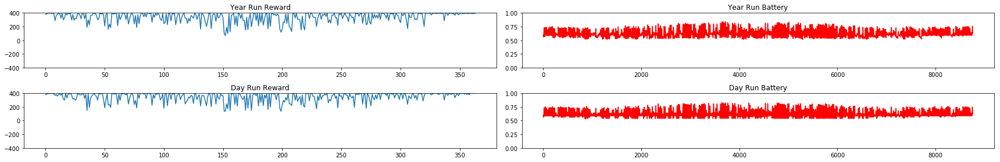

In [12]:
yr_test_reward_rec = yr_test_record[:,2]
yr_test_reward_rec = yr_test_reward_rec[yr_test_reward_rec != 0]

day_test_reward_rec = day_test_record[:,2]
day_test_reward_rec = day_test_reward_rec[day_test_reward_rec != 0]


fig = plt.figure(figsize=(24,4))
ax1 = fig.add_subplot(221)
ax1.plot(yr_test_reward_rec)
ax1.set_title("Year Run Reward")
ax1.set_ylim([-400,400])

ax2 = fig.add_subplot(222)
ax2.plot(yr_test_record[:,0],'r')
ax2.set_title("Year Run Battery")
ax2.set_ylim([0,1])

ax3 = fig.add_subplot(223)
ax3.plot(day_test_reward_rec)
ax3.set_title("Day Run Reward")
ax3.set_ylim([-400,400])

ax4 = fig.add_subplot(224)
ax4.plot(day_test_record[:,0],'r')
ax4.set_title("Day Run Battery")
ax4.set_ylim([0,1])

fig.tight_layout()



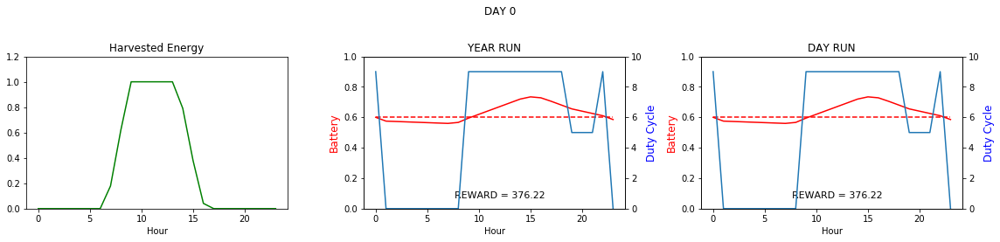

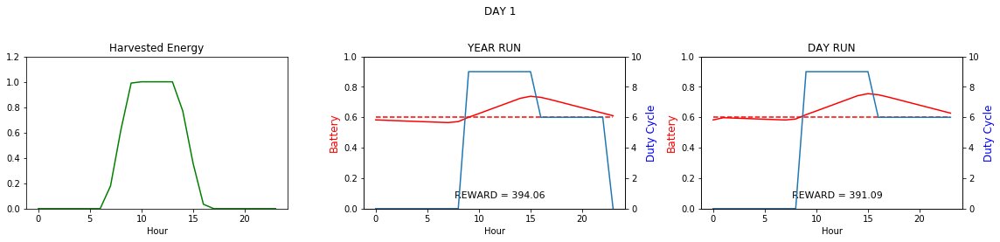

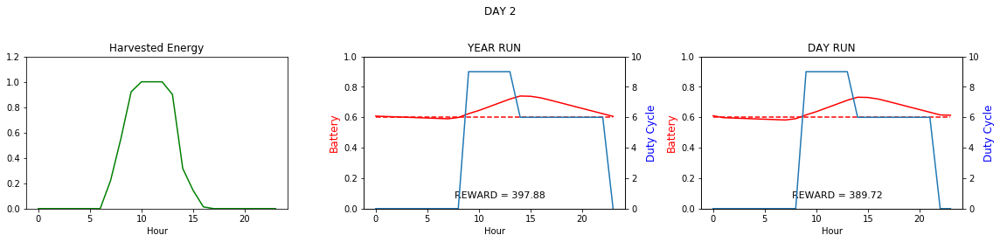

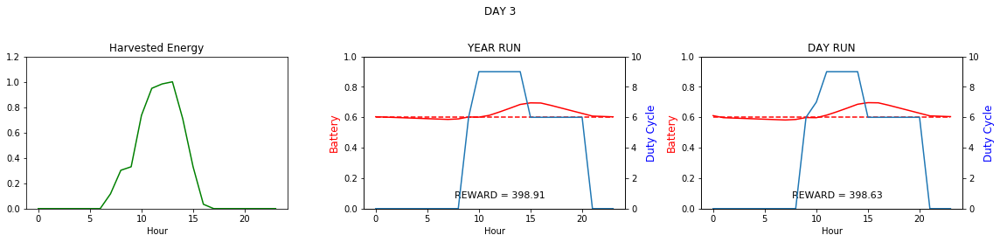

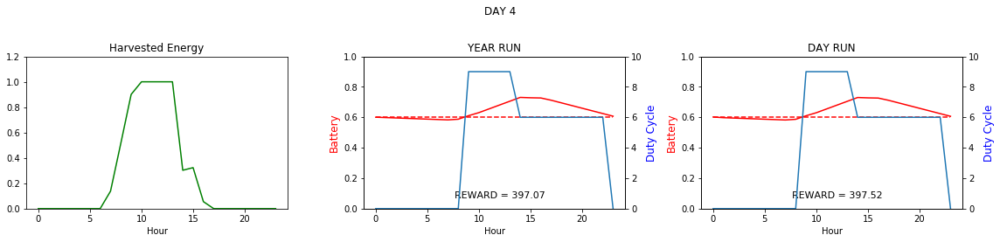

...

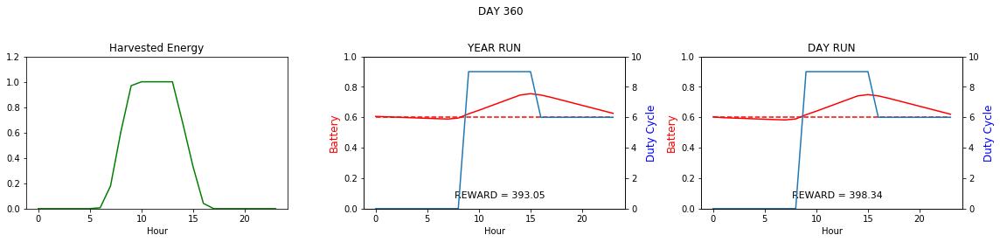

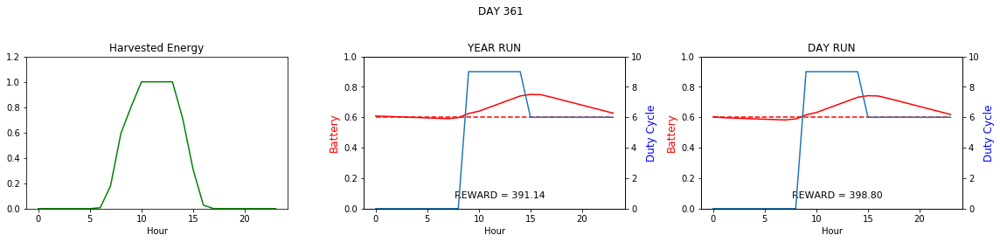

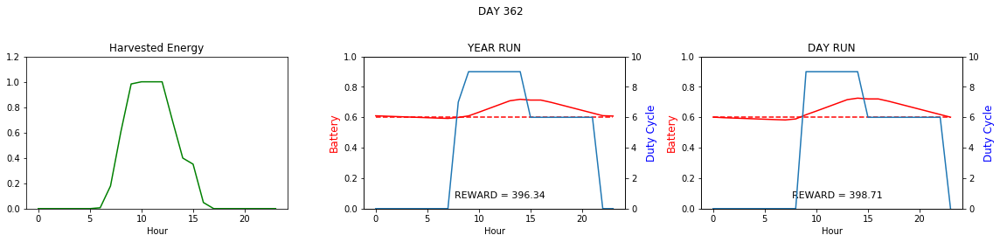

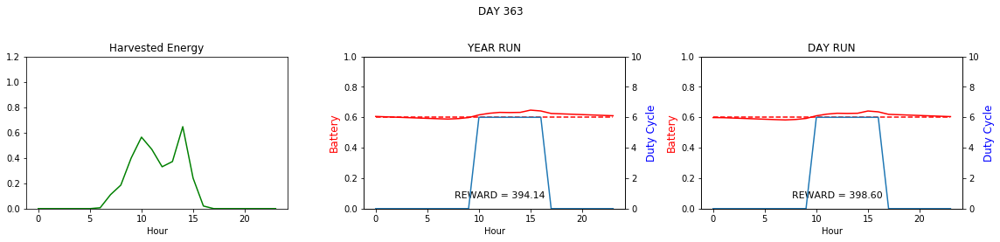

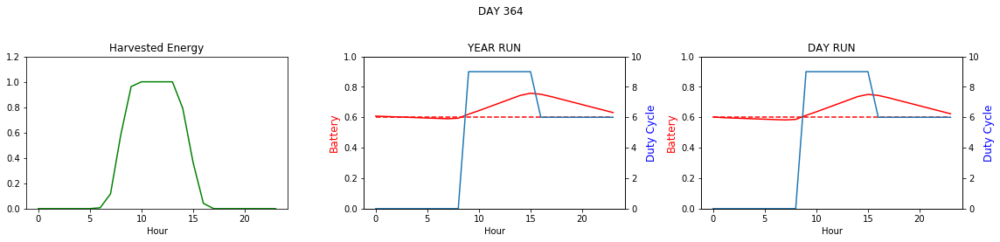

In [13]:
TIME_AXIS = np.arange(0,eno.TIME_STEPS)
for DAY in range(eno.NO_OF_DAYS):
    START = DAY*24
    END = START+24

    fig = plt.figure(figsize=(16,4))
    st = fig.suptitle("DAY %s" %(DAY))

    ax2 = fig.add_subplot(131)
    ax2.plot(yr_test_record[START:END,1],'g')
    ax2.set_title("Harvested Energy")
    plt.xlabel("Hour")
    ax2.set_ylim([0,1.2])

    #plot battery for year run
    ax1 = fig.add_subplot(132)
    ax1.plot(TIME_AXIS,yr_test_record[START:END,0],'r') 
    ax1.plot(TIME_AXIS, np.ones(eno.TIME_STEPS)*eno.BOPT/eno.BMAX,'r--')
    ax1.set_title("YEAR RUN")
    if END < (eno.NO_OF_DAYS*eno.TIME_STEPS):
        ax1.text(12, 0, "REWARD = %.2f\n" %(yr_test_record[END,2]),fontsize=11, ha='center')
    plt.xlabel("Hour")
    ax1.set_ylabel('Battery', color='r',fontsize=12)
    ax1.set_ylim([0,1])

    #plot actions for year run
    ax1a = ax1.twinx()
    ax1a.plot(yr_test_record[START:END,3])
    ax1a.set_ylim([0,N_ACTIONS])
    ax1a.set_ylabel('Duty Cycle', color='b',fontsize=12)

    
    
    #plot battery for day run
    ax3 = fig.add_subplot(133)
    ax3.plot(TIME_AXIS,day_test_record[START:END,0],'r') 
    ax3.plot(TIME_AXIS, np.ones(eno.TIME_STEPS)*eno.BOPT/eno.BMAX,'r--')
    ax3.set_title("DAY RUN")
    if END < (eno.NO_OF_DAYS*eno.TIME_STEPS):
        ax3.text(12, 0, "REWARD = %.2f\n" %(day_test_record[END,2]),fontsize=11, ha='center')
    plt.xlabel("Hour")
    ax3.set_ylabel('Battery', color='r',fontsize=12)
    ax3.set_ylim([0,1])
    
    #plot actions for day run
    ax3a = ax3.twinx()
    ax3a.plot(day_test_record[START:END,3])
    ax3a.set_ylim([0,N_ACTIONS])
    ax3a.set_ylabel('Duty Cycle', color='b',fontsize=12)

    fig.tight_layout()
    st.set_y(0.95)
    fig.subplots_adjust(top=0.75)
    plt.show()